In [1]:
import os
from datetime import datetime, date
import pandas as pd
from pyspark.sql import SparkSession
import numpy as np
import plotly
import plotly.express as px
import plotly.graph_objects as go
import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
spark = (
    SparkSession.builder.appName("covid19-benchmark-{}".format(datetime.today()))
                .master("spark://spark-master:7077")
                .getOrCreate()
)

In [3]:
spark_covid19_daily_stats = spark.read.parquet("s3a://warehouse/gold/medical/covid19_daily_stats.pq")
spark_covid19_continent_stats = spark.read.parquet("s3a://warehouse/gold/medical/covid19_continent_stats.pq")
df1 = pd.DataFrame(spark_covid19_daily_stats.toPandas())
df2 = pd.DataFrame(spark_covid19_continent_stats.toPandas())

,date,country_region,confirmed,deaths,recovered,active,latitude,longtitude,who_region
0,2020-07-27,Russia,816680,13334,602249,201097,61.5240,105.3190,Europe
1,2020-07-26,Russia,811073,13249,599172,198652,61.5240,105.3190,Europe
2,2020-07-25,Russia,805332,13172,596064,196096,61.5240,105.3190,Europe
3,2020-07-24,Russia,799499,13026,587728,198745,61.5240,105.3190,Europe
4,2020-07-23,Russia,793720,12873,579295,201552,61.5240,105.3190,Europe
...,...,...,...,...,...,...,...,...,...
49063,2020-01-26,Netherlands,0,0,0,0,18.0425,-63.0548,Europe
49064,2020-01-25,Netherlands,0,0,0,0,18.0425,-63.0548,Europe
49065,2020-01-24,Netherlands,0,0,0,0,18.0425,-63.0548,Europe
49066,2020-01-23,Netherlands,0,0,0,0,18.0425,-63.0548,Europe


,Continent,TotalCases,TotalDeaths,TotalRecovered
0,Europe,2482951,155775,1605640
1,Africa,828239,17759,487793
2,Australia/Oceania,16949,189,10854
3,North America,768505,59215,428613
4,South America,3780484,135506,2714173
5,Asia,3799878,85740,2722251


In [4]:
df1.describe()

,confirmed,deaths,recovered,active,latitude,longtitude
count,4.906800e+04,49068.000000,4.906800e+04,4.906800e+04,49068.000000,49068.000000
mean,3.845235e+04,2956.460178,1.700747e+04,1.848842e+04,21.433731,23.528225
std,1.346153e+05,9114.375792,5.857974e+04,8.321895e+04,24.950320,70.442730
min,0.000000e+00,0.000000,0.000000e+00,-2.000000e+00,-51.796300,-135.000000
25%,1.200000e+01,0.000000,0.000000e+00,5.000000e+00,7.873050,-15.310100
50%,1.058500e+03,20.000000,1.250000e+02,4.330000e+02,23.634500,21.745300
75%,3.881500e+04,1316.250000,5.853000e+03,4.528000e+03,41.204400,80.771800
max,4.290259e+06,148011.000000,1.846641e+06,2.816444e+06,71.706900,178.065000


In [5]:
df1.sort_values(by='date', inplace = True)

In [7]:
data_VIETNAM = df1[df1.country_region == 'Vietnam']

,date,country_region,confirmed,deaths,recovered,active,latitude,longtitude,who_region
48315,2020-01-22,Vietnam,0,0,0,0,14.0583,108.277,Western Pacific
48314,2020-01-23,Vietnam,2,0,0,2,14.0583,108.277,Western Pacific
48313,2020-01-24,Vietnam,2,0,0,2,14.0583,108.277,Western Pacific
48312,2020-01-25,Vietnam,2,0,0,2,14.0583,108.277,Western Pacific
48311,2020-01-26,Vietnam,2,0,0,2,14.0583,108.277,Western Pacific
...,...,...,...,...,...,...,...,...,...
48132,2020-07-23,Vietnam,412,0,365,47,14.0583,108.277,Western Pacific
48131,2020-07-24,Vietnam,415,0,365,50,14.0583,108.277,Western Pacific
48130,2020-07-25,Vietnam,417,0,365,52,14.0583,108.277,Western Pacific
48129,2020-07-26,Vietnam,420,0,365,55,14.0583,108.277,Western Pacific


In [8]:
np.min(data_VIETNAM.date), np.max(data_VIETNAM.date)

(datetime.date(2020, 1, 22), datetime.date(2020, 7, 27))

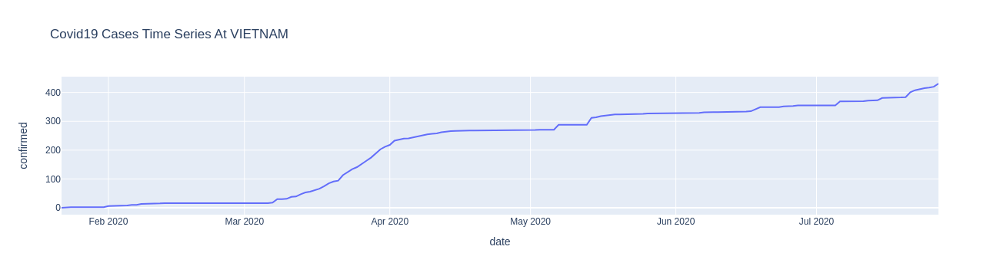

In [9]:
fig = px.line(data_VIETNAM,x='date',y = 'confirmed',title='Covid19 Cases Time Series At VIETNAM')
fig.show()

### Get only the necessary features  

In [10]:
data_VIETNAM = data_VIETNAM[data_VIETNAM.confirmed > 16]
data_VIETNAM = data_VIETNAM[data_VIETNAM.confirmed <= 271]
data_VIETNAM

,date,country_region,confirmed,deaths,recovered,active,latitude,longtitude,who_region
48270,2020-03-07,Vietnam,18,0,16,2,14.0583,108.277,Western Pacific
48269,2020-03-08,Vietnam,30,0,16,14,14.0583,108.277,Western Pacific
48268,2020-03-09,Vietnam,30,0,16,14,14.0583,108.277,Western Pacific
48267,2020-03-10,Vietnam,31,0,16,15,14.0583,108.277,Western Pacific
48266,2020-03-11,Vietnam,38,0,16,22,14.0583,108.277,Western Pacific
...,...,...,...,...,...,...,...,...,...
48214,2020-05-02,Vietnam,270,0,219,51,14.0583,108.277,Western Pacific
48213,2020-05-03,Vietnam,271,0,219,52,14.0583,108.277,Western Pacific
48212,2020-05-04,Vietnam,271,0,219,52,14.0583,108.277,Western Pacific
48211,2020-05-05,Vietnam,271,0,232,39,14.0583,108.277,Western Pacific


In [11]:
CT16 = '2020-03-31'
CT19 = '2020-04-24'

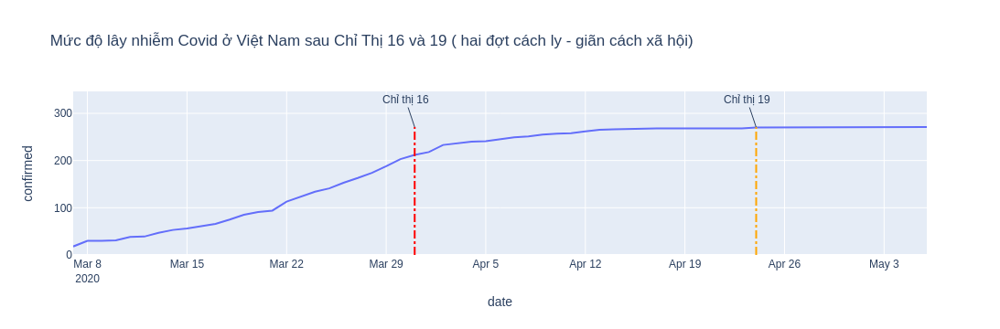

In [12]:
fig = px.line(data_VIETNAM,x='date',y = 'confirmed',title='Mức độ lây nhiễm Covid ở Việt Nam sau Chỉ Thị 16 và 19 ( hai đợt cách ly - giãn cách xã hội)')
fig.add_shape(dict(type='line',
                   x0=CT16,
                   y0=0,
                   x1=CT16,
                   y1=data_VIETNAM['confirmed'].max(),
                   line = dict(color='red',dash="dashdot")
                   ))
fig.add_annotation(dict(
                   x = CT16,
                   y = data_VIETNAM['confirmed'].max(),
                   text = 'Chỉ thị 16')
)
fig.add_shape(dict(type='line',
                   x0=CT19,
                   y0=0,
                   x1=CT19,
                   y1=data_VIETNAM['confirmed'].max(),
                   line = dict(color='orange',dash="dashdot")
                   ))
fig.add_annotation(dict(
                   x = CT19,
                   y = data_VIETNAM['confirmed'].max(),
                   text = 'Chỉ thị 19')
)
fig.show()

> $ \rightarrow $ **Nhận xét:** Sau từng đợt giãn cách xã hội, tỉ lệ gia tăng của ca nhiễm ở Việt Nam bị giảm đi đáng kể.

#### **Đặt vấn đề:** Nếu không có chỉ thị 16 trong phòng dịch thì sao? Hay nói cách khác: Việt Nam không thực hiện giãn cách xã hội thì mức độ lây nhiễm sẽ tới đâu? (Synthetic-Control Problem)

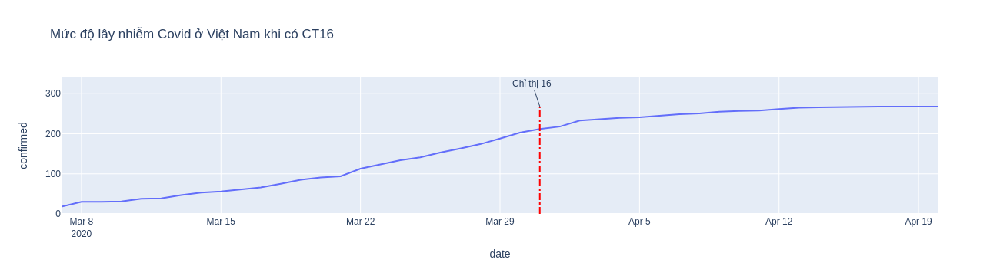

In [13]:
data_VIETNAM = data_VIETNAM[pd.to_datetime(data_VIETNAM.date) <= pd.to_datetime(date(2020,4,20))]
fig = px.line(data_VIETNAM,x='date',y = 'confirmed',title='Mức độ lây nhiễm Covid ở Việt Nam khi có CT16')
fig.add_shape(dict(type='line',
                   x0=CT16,
                   y0=0,
                   x1=CT16,
                   y1=data_VIETNAM['confirmed'].max(),
                   line = dict(color='red',dash="dashdot")
                   ))
fig.add_annotation(dict(
                   x = CT16,
                   y = data_VIETNAM['confirmed'].max(),
                   text = 'Chỉ thị 16')
)

In [14]:
df1.who_region.unique()

array(['Europe', 'South-East Asia', 'Americas', 'Africa',
       'Western Pacific', 'Eastern Mediterranean'], dtype=object)

In [15]:
import pandas as pd
df1.date = pd.to_datetime(df1.date)
data_BROTHERS = df1.loc[(df1.who_region == 'South-East Asia') | (df1.country_region == 'Vietnam')]
data_select = data_BROTHERS[data_BROTHERS.date <= pd.to_datetime(date(2020,3,31))]
data_select = data_select[data_select.date >= pd.to_datetime(date(2020,3,7))]
data_synth = data_select.pivot(index = "country_region",
                                columns = "date")["confirmed"].T

In [16]:
from sklearn.linear_model import LinearRegression
Y = data_synth["Vietnam"].values # Vietnam covid19
X = (data_synth.drop(columns="Vietnam")
     .values)  # other countries
Y.shape, X.shape

((25,), (25, 10))

In [17]:
data_synth

country_region,Bangladesh,Bhutan,Burma,India,Indonesia,Maldives,Nepal,Sri Lanka,Thailand,Timor-Leste,Vietnam
date,,,,,,,,,,,
2020-03-07,0,1,0,34,4,0,1,1,50,0,18
2020-03-08,3,1,0,39,6,4,1,1,50,0,30
2020-03-09,3,1,0,43,19,4,1,1,50,0,30
2020-03-10,3,1,0,56,27,6,1,1,53,0,31
2020-03-11,3,1,0,62,34,8,1,2,59,0,38
2020-03-12,3,1,0,73,34,8,1,2,70,0,39
2020-03-13,3,1,0,82,69,9,1,6,75,0,47
2020-03-14,3,1,0,102,96,10,1,10,82,0,53
2020-03-15,5,1,0,113,117,13,1,18,114,0,56


In [ ]:
data_for_synth_line = (data_BROTHERS[data_BROTHERS["country_region"] != 'Vietnam']
                  .loc[lambda x: (x.date <= pd.to_datetime(date(2020,5,6)))]
                  .loc[lambda x: (pd.to_datetime(date(2020,3,7)) <= x.date)]
                  .pivot(index='date', columns="country_region")["confirmed"])

#### **Fit Weights bằng Linear Regression:**

$||\pmb{X}_1 - \pmb{X}_0 \pmb{W}|| = \bigg(\sum^k_{h=1}v_h \bigg(X_{h1} - \sum^{J+1}_{j=2} w_j X_{hj} \bigg)^2 \bigg)^{\frac{1}{2}}$

In [18]:
weights_lr = LinearRegression(fit_intercept = False).fit(X,Y).coef_

array([-0.10893782,  8.73269379, -1.80399272,  0.02270781, -0.00903101,
        2.86670085,  3.11041653,  0.20735996,  0.05780642,  0.26259073])

#### **Đường synthetic control của Covid19 (các dữ liệu ước lượng $\hat{Y}$)**

$\hat{Y}^N_{jt} = \sum^{J+1}_{j=2} w_j Y_{jt}$

In [19]:
covid_synth_lr = data_for_synth_line.values.dot(weights_lr)

(61,)

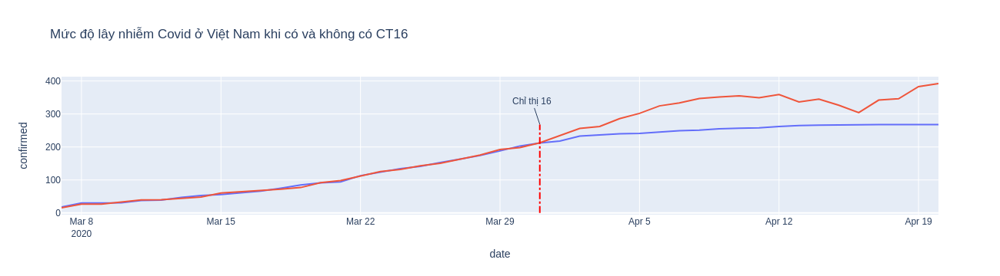

In [20]:
fig = px.line(data_VIETNAM,x='date',y = 'confirmed',title='Mức độ lây nhiễm Covid ở Việt Nam khi có và không có CT16')
fig.add_scatter(x=data_VIETNAM['date'],y = covid_synth_lr)
fig.add_shape(dict(type='line',
                   x0=CT16,
                   y0=0,
                   x1=CT16,
                   y1=data_VIETNAM['confirmed'].max(),
                   line = dict(color='red',dash="dashdot")
                   ))
fig.add_annotation(dict(
                   x = CT16,
                   y = data_VIETNAM['confirmed'].max(),
                   text = 'Chỉ thị 16')
)
fig.update_traces(showlegend = False)

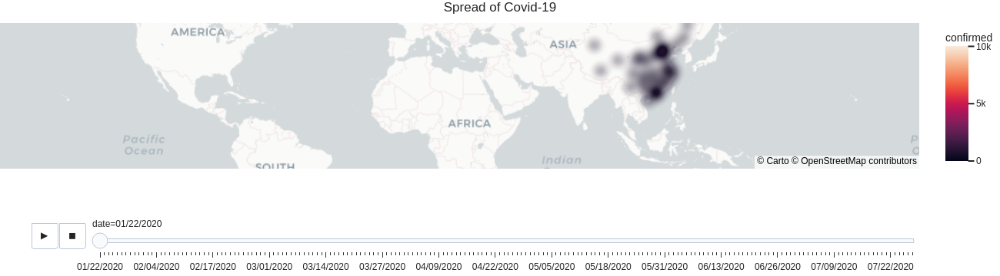

In [65]:
import plotly.io as pio
pio.templates.default = "seaborn"
df1['date'] = df1['date'].dt.strftime('%m/%d/%Y')
fig_map = px.density_mapbox(df1, lat='latitude', lon='longtitude', z='confirmed', radius=20,zoom=1, hover_data=["country_region","who_region","confirmed"],
                        mapbox_style="carto-positron", animation_frame = 'date', range_color= [0, 10000],title='Spread of Covid-19')
fig_map.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
fig_map.show()

In [4]:
top = df1[df1['date'] == df1['date'].max()]
world = top.groupby('country_region')['confirmed','active','deaths'].sum().reset_index()
world['size'] = world['deaths'].pow(0.2)
fig = px.scatter_geo(world, locations="country_region",locationmode='country names', color="deaths",
                     hover_name="country_region", size="size",hover_data = ['country_region','deaths'],
                     projection="natural earth",title='Death count of each country')
fig.show()

In [67]:
import os.path
import sys, json
import requests
import subprocess
from requests.exceptions import RequestException
from requests.adapters import HTTPAdapter
from collections import namedtuple

In [5]:
df1.to_csv("./df1.csv", index = False)
df2.to_csv("./df2.csv", index = False)

In [110]:
%%writefile my_dash_app.py
import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output
from datetime import datetime, date
import pandas as pd
import plotly.express as px
import plotly.io as pio
pio.templates.default = "seaborn"
app = dash.Dash(__name__)
app.config.suppress_callback_exceptions = True
fig_map = px.density_mapbox(df1, lat='latitude', lon='longtitude', z='confirmed', radius=20,zoom=1, hover_data=["country_region","who_region","confirmed"],
                        mapbox_style="carto-positron", animation_frame = 'date', range_color= [0, 10000],title='Spread of Covid-19')
fig_map.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
# You can edit this layout to include more graphs
# Define the app
app.layout = html.Div(children=[
                      html.Div(className='row',  # Define the row element
            children=[ 
                      html.H2('Dash - COVID19'),
                      html.P('''Visualising time series with Plotly - Dash''')
            ])
])
dcc.Graph(
    id='timeseries',
    config={'displayModeBar': False}, 
    animate=True,
    figure=fig_map
)
# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

Overwriting my_dash_app.py


In [ ]:
!python my_dash_app.py

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app 'my_dash_app'
 * Debug mode: on
